# Use GANs to create art - will you be the next Monet?
<div class="alert alert-block alert-info">
Peer-graded Assignment 5 for DTSA 5511 (Introduction to Deep Learning)<br>
</div>

## 1. Introduction

### 1.1 Background

<font color="blue">Statement from the website</font>: *We recognize the works of artists through their unique style, such as color choices or brush strokes. The “je ne sais quoi” of artists like Claude Monet can now be imitated with algorithms thanks to generative adversarial networks (GANs). In this getting started competition, you will bring that style to your photos or recreate the style from scratch!*

*Computer vision has advanced tremendously in recent years and GANs are now capable of mimicking objects in a very convincing way. But creating museum-worthy masterpieces is thought of to be, well, more art than science. So can (data) science, in the form of GANs, trick classifiers into believing you’ve created a true Monet? That’s the challenge you’ll take on!*


### 1.2 Objectives

<font color="blue">Statement from the website</font>: *A GAN consists of at least two neural networks: a generator model and a discriminator model. The generator is a neural network that creates the images. For our competition, you should generate images in the style of Monet. This generator is trained using a discriminator.*

*The two models will work against each other, with the generator trying to trick the discriminator, and the discriminator trying to accurately classify the real vs. generated images.*

This project is about building deep neural network model on image-to-image translation task. The data is originated from Kaggle and the problem belongs to <font color='red'>image style transfer</font>. Two GAN architecture: DCGan and CycleGan will be tested and compared in this project. Comparison will be based on visual inspection and score calculated by Kaggle submission. The main part of this study is about finding workable architecture for the problem. A small range hyperparameter tuning will also be performed to find relatively optimal architectures.

### 1.3 Data Source

- Amy Jang, Ana Sofia Uzsoy, Phil Culliton. (2020). I’m Something of a Painter Myself. Kaggle. https://kaggle.com/competitions/gan-getting-started

Importing required packages:

In [1]:
import datetime
import random
import os
import zipfile
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms
from torchvision.utils import save_image
import cv2

Checking availability of GPU. This study will apply PyTorch framework for building and training neural network models.

In [2]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("GPU is available and being used")
else:
    device = torch.device("cpu")
    print("GPU is available and being used")

GPU is available and being used


## 2. Data Preparation and Exploratory Data Analysis

### 2.1 Training vs Testing Data

We use two directories from the original dataset: <font color="blue">monet_jpg</font>, and <font color="blue">photo_jpg</font>. The directory monet_jpg contains paintings by Monet, which exhibit the style we aim to transfer onto photo images residing in directory photo_jpg. Other photos outside of this dataset can be transformed as long as keeping the final submission limited to 10,000 images. (Note: Monet-style art can be created from scratch using other GAN architectures like DCGAN. The submitted image files do not necessarily have to be transformed photos.)

Load all the images and turn them into to tensors.

In [3]:
IMAGE_PATH = "data"

dataset = ImageFolder(IMAGE_PATH, transform = transforms.Compose([transforms.ToTensor()]))
dataloader = DataLoader(dataset, batch_size = 128, num_workers = 4)

monet_images, photo_images = None, None
all_intensities, all_labels = None, None

for images, labels in dataloader:
    if monet_images is None:
        monet_images = images[labels==0]
    else:
        monet_images = torch.cat((monet_images, images[labels==0]), dim = 0)
    if photo_images is None:
        photo_images = images[labels==1]
    else:
        photo_images = torch.cat((photo_images, images[labels==1]), dim = 0)

    if all_intensities is None or all_labels is None:
        all_intensities = images.mean(axis=(1,2,3))
        all_labels = labels
    else:
        all_intensities = torch.cat((all_intensities, images.mean(axis=(1,2,3))), 0)
        all_labels = torch.cat((all_labels, labels), 0)

### 2.2 Data Description (training data set)

- Number of Monet images: 300
- Monet images storage usage: 3.5MB
- Number of photo images: 7,038
- Photo images storage usage: 107MB
- Image dimension: 256x256x3 (WxHxC)

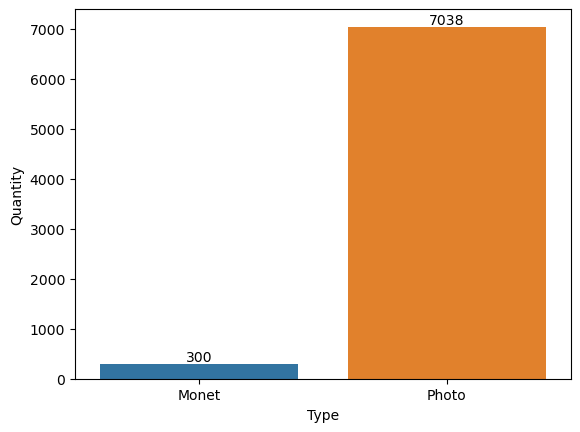

Image dimension: (3, 256, 256)


In [4]:
ax = sns.barplot(data = pd.DataFrame({"Type": ["Monet", "Photo"], "Quantity": [monet_images.shape[0], photo_images.shape[0]]}),
                 x = "Type", y = "Quantity")
ax.bar_label(ax.containers[0], fontsize=10);
plt.show()
print("Image dimension: {}".format(tuple(photo_images.shape[1:])))

### 2.3 Sample Images
We randomly pick 4 images from each categories (monent and photo) and display as follows.

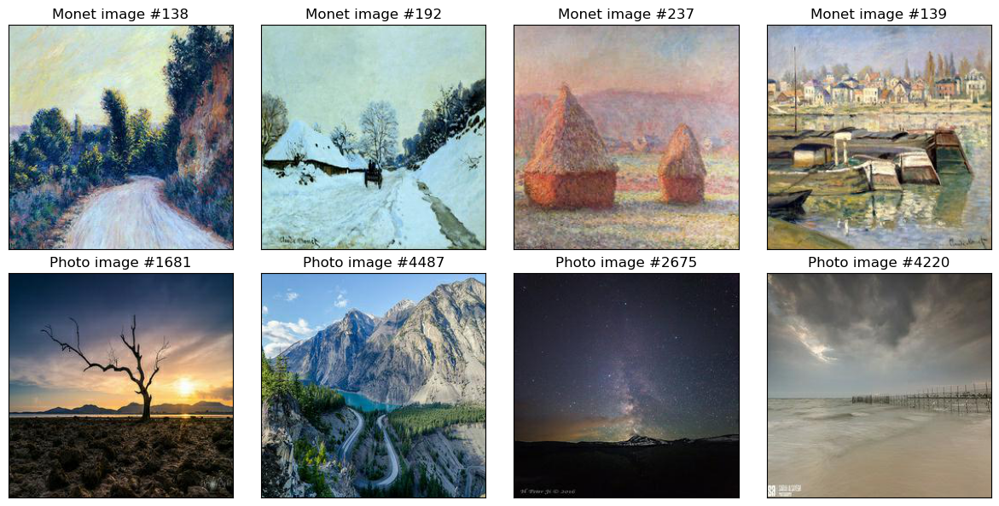

In [5]:
nrow, ncol = 2, 4

monet_img_idx = random.sample(range(len(monet_images)), ncol)
photo_img_idx = random.sample(range(len(photo_images)), ncol)

fig, ax = plt.subplots(nrow, ncol, figsize = (ncol*3, nrow*3))
for i in range(nrow):
    for j in range(ncol):
        if i%2 == 0:
            ax[i, j].imshow(monet_images[monet_img_idx[j]].permute((1, 2, 0)))
            ax[i, j].set_title("Monet image #" + str(monet_img_idx[j]))
        else:
            ax[i, j].imshow(photo_images[photo_img_idx[j]].permute((1, 2, 0)))
            ax[i, j].set_title("Photo image #" + str(photo_img_idx[j]))
        ax[i, j].set_xticks([])
        ax[i, j].set_yticks([])    
plt.tight_layout()
plt.show()

### 2.4 Image intensity Analysis
* We normalize the image data in the loading processing (divided by 255), all the values will be in the range of [0,1].
* We then calculate average intensity of the images and plot them in the below KDE plot. We find out that images from different categories display different patterns in intensity (peak of intensity).

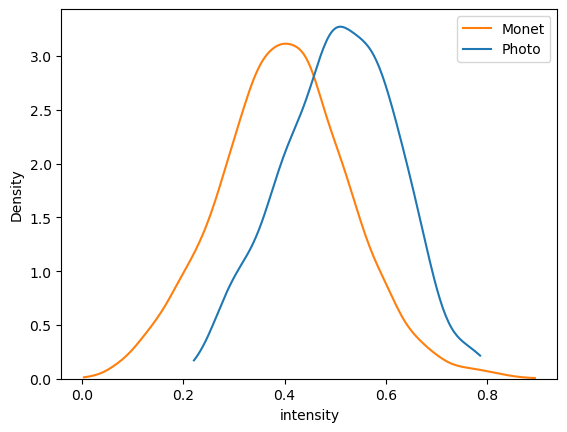

In [6]:
ax = sns.kdeplot(pd.DataFrame({"intensity": all_intensities, "label": all_labels}), x = "intensity", hue = "label", cut = 0, common_norm = False)
ax.legend(["Monet", "Photo"])
plt.show()

## 3. Model Architecture

### 3.1 Deep Convolutional Generative Adversarial Network (DCGAN)

A Deep Convolutional Generative Adversarial Network (DCGAN) is designed for generating realistic and high-quality images. DCGANs are a subset of Generative Adversarial Networks (GANs) and are particularly well-suited for image generation tasks. DCGANs consist of two key components: a generator and a discriminator, which work together in a adversarial manner. Here's a brief overview of these components and how they operate:

* Generator: The generator takes random noise as input and transforms it into images that resemble those in the training dataset. It comprises multiple layers of convolutional and transposed convolutional layers, each progressively upscaling and refining the generated image. The generator's objective is to produce images that are indistinguishable from real images.
* Discriminator: The discriminator, on the other hand, is a convolutional neural network tasked with distinguishing between real images from the dataset and fake images produced by the generator. It learns to assign high probabilities to real images and low probabilities to fake ones.

The training process of a DCGAN involves a back-and-forth interaction between the generator and discriminator:

* Initialization: The generator starts with random noise and generates images, while the discriminator is trained on real images from the dataset.
* Adversarial Training: The discriminator evaluates both real and generated images, providing feedback to the generator. The generator aims to produce images that are increasingly convincing, while the discriminator aims to become more accurate in its discrimination.
* Convergence: Over time, this adversarial training process leads to both the generator and discriminator improving their capabilities. Eventually, the generator produces images that are difficult to distinguish from real ones.

The concrete structure of the DCGAN we use in this study is as follows:

In [7]:
class DCGanGenerator(nn.Module):
    def __init__(self):
        super().__init__()
        self.convt1 = nn.ConvTranspose2d(1, 64, 3, 2)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu1 = nn.ReLU()
        self.convt2 = nn.ConvTranspose2d(64, 128, 3, 2, 1)
        self.bn2 = nn.BatchNorm2d(128)
        self.relu2 = nn.ReLU()
        self.convt3 = nn.ConvTranspose2d(128, 64, 3, 2, 1)
        self.bn3 = nn.BatchNorm2d(64)
        self.relu3 = nn.ReLU()
        self.convt4 = nn.ConvTranspose2d(64, 3, 2, 2, 1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        x = self.relu1(self.bn1(self.convt1(x)))
        x = self.relu2(self.bn2(self.convt2(x)))
        x = self.relu3(self.bn3(self.convt3(x)))
        x = self.sigmoid(self.convt4(x))
        return x

def get_noise(n_samples, noise_dim=16, device="cpu"):
    return torch.randn(n_samples, 1, noise_dim, noise_dim, device=device)

In [8]:
class DCGanDiscriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, 5, 3, 1)
        self.bn1 = nn.BatchNorm2d(32)
        self.lrelu1 = nn.LeakyReLU(0.1)
        self.maxpool1 = nn.MaxPool2d(2)
        self.conv2 = nn.Conv2d(32, 64, 5, 3, 1)
        self.bn2 = nn.BatchNorm2d(64)
        self.lrelu2 = nn.LeakyReLU(0.1)
        self.maxpool2 = nn.MaxPool2d(2)
        self.linear = nn.Linear(3136, 1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        x = self.maxpool1(self.lrelu1(self.bn1(self.conv1(x))))
        x = self.maxpool2(self.lrelu2(self.bn2(self.conv2(x))))
        x = self.sigmoid(self.linear(x.view(x.shape[0], -1)))
        return x

### 3.2 Training of DCGAN

We are unable to produce any meaning result by our DCGAN model (even after 1000 epochs). Since we have only 300 monet-style images, it seems that it is insufficient to train a model reproducing similar images. Despite of this, the generator and discriminator loss of the training exhibit some typical patterns of GAN training.

#### A typical pattern of GAN training:
* Early phase: initially, both the generator and discriminator are untrained, and their losses are high. The generator's loss is typically high, as it produces poor-quality images that are easily distinguishable from real ones. The discriminator's loss is also relatively high since it struggles to differentiate between real and fake images.
* Early discriminator improvement: as training progresses, the discriminator becomes more skilled at distinguishing real images from fake ones. The discriminator's loss decreases, approaching zero, as it gets better at correctly classifying real and fake images. The generator's loss also decreases but remains relatively high because the generator is still producing low-quality images.
* Generator improvement: as the discriminator becomes more adept, it becomes harder for the generator to fool it. The generator's loss begins to decrease more significantly as it adjusts its parameters to produce more convincing images. There is a balance between the generator and discriminator, and their losses start to stabilize.
* Convergence: in an ideal scenario, the generator and discriminator losses reach a point where they stabilize and fluctuate around a certain value. The generator's loss is relatively low, indicating that it can produce images that are difficult to distinguish from real ones. The discriminator's loss remains relatively low as well, but it oscillates around a value close to 0.5 since it's performing a nearly random guessing task.

<font color="red">In our training, the losses follow the first three phases and show the sign of convergence at around epoch = 400. However, the model eventually diverges again and more importantly, we don't see any meaningful image from the model output so the first architecture we tried is failed.</font>

2023-10-11 21:41:17.311597 Epoch 250, Generator loss 12.8931, Discriminator loss 0.0385


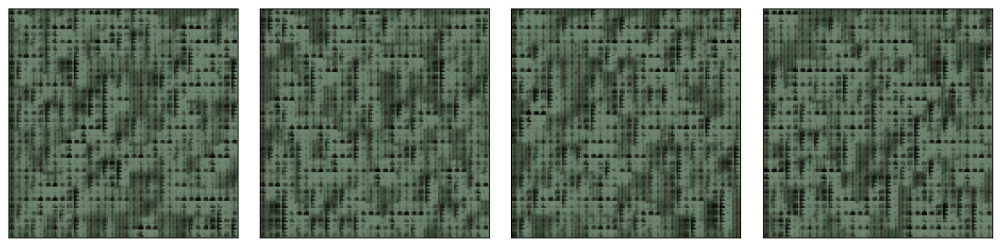

2023-10-11 21:43:10.310363 Epoch 500, Generator loss 12.2588, Discriminator loss 0.1002


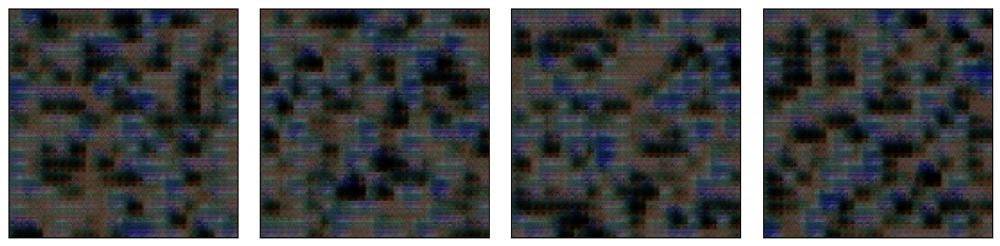

2023-10-11 21:45:03.509350 Epoch 750, Generator loss 16.7591, Discriminator loss 0.0128


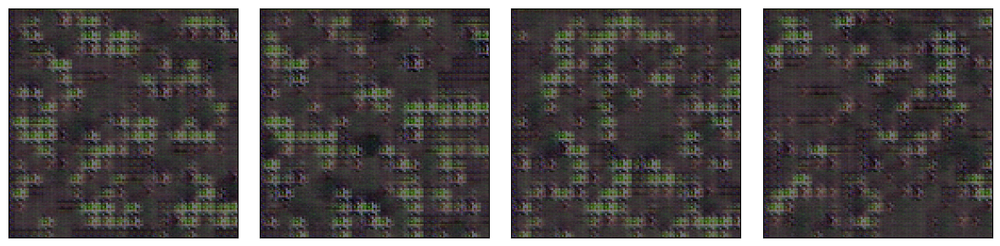

2023-10-11 21:46:57.334483 Epoch 1000, Generator loss 16.9409, Discriminator loss 0.0159


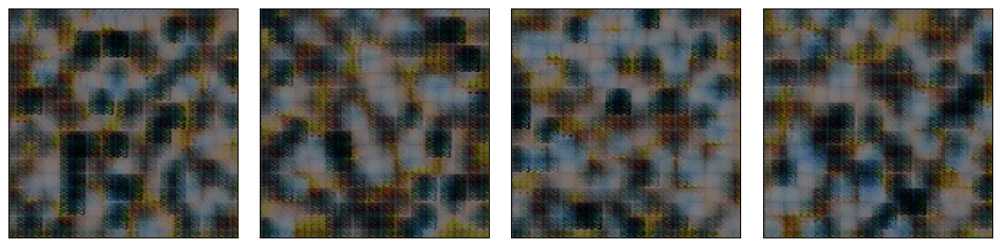

In [9]:
n_epochs, lr, batch_size = 1000, 1e-4, 128

dataset = TensorDataset(monet_images)
g = torch.Generator()
g.manual_seed(0)
dataloader = DataLoader(dataset, shuffle = True, batch_size = batch_size, generator = g)

gen = DCGanGenerator()
gen.to(device)
disc = DCGanDiscriminator()
disc.to(device)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

criterion = nn.BCELoss()
gen_optim = optim.Adam(gen.parameters(), lr = lr)
disc_optim = optim.Adam(disc.parameters(), lr = lr)

generator_losses, discriminator_losses = [], []
for epoch in range(1, n_epochs+1):
    generator_loss, discriminator_loss = 0, 0
    for real in dataloader:
        cur_batch_size = len(real)
        real = real[0].to(device)

        disc_optim.zero_grad()
        fake_noise = get_noise(batch_size, 16, device=device)
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake.detach())
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_pred = disc(real)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward()
        disc_optim.step()
        discriminator_loss += disc_loss.item() / cur_batch_size

        gen_optim.zero_grad()
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_optim.step()
        generator_loss += gen_loss.item() / cur_batch_size

    discriminator_losses += [discriminator_loss / len(dataloader)]
    generator_losses += [generator_loss / len(dataloader)]
    if epoch % 250 == 0:
        fmt_str = '{} Epoch {}, Generator loss {:.4f}, Discriminator loss {:.4f}'
        print(fmt_str.format(datetime.datetime.now(), epoch, generator_loss, discriminator_loss))

        nrow, ncol = 1, 4

        fig, ax = plt.subplots(nrow, ncol, figsize = (ncol*3, nrow*3))
        for j in range(ncol):
            ax[j].imshow(fake.to("cpu").detach()[j].permute((1, 2, 0)))
            ax[j].set_xticks([])
            ax[j].set_yticks([])    
        plt.tight_layout()
        plt.show()        

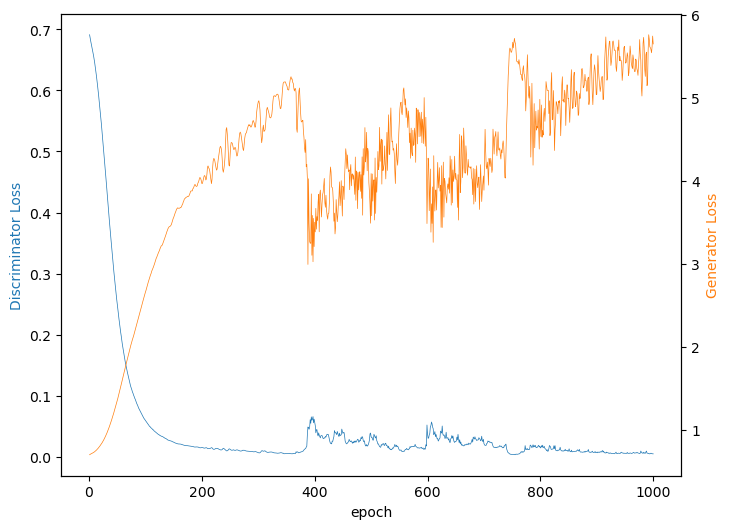

In [10]:
fig, ax = plt.subplots(1, 1, figsize = (8, 6))
ax.plot(range(1, len(discriminator_losses)+1), discriminator_losses, '-', linewidth=0.5, label="Discriminator", color = "tab:blue")
ax2 = ax.twinx()
ax2.plot(range(1, len(generator_losses)+1), generator_losses, '-', linewidth=0.5, label="Generator", color = "tab:orange")
ax.set_xlabel("epoch")
ax.set_ylabel("Discriminator Loss", color = "tab:blue")
ax2.set_ylabel("Generator Loss", color = "tab:orange")
plt.show()

### 3.3 Cycle Generative Adversarial Network (CycleGAN)

A Cycle Generative Adversarial Network (CycleGAN) is designed for unsupervised image-to-image translation. It was introduced as a way to learn mappings between two domains (e.g., horses to zebras or black-and-white photos to color photos) without the need for paired data for training. CycleGANs are a subset of Generative Adversarial Networks (GANs) and are known for their ability to perform style transfer, domain adaptation, and image transformation tasks. Key components and characteristics of CycleGANs include:

* Dual Generators and Dual Discriminators: CycleGANs consist of two generators and two discriminators. One generator translates images from one domain to the other, while the other performs the reverse translation. The corresponding discriminators assess the realism of the translated images.
* Cycle Consistency: The core idea of CycleGANs is the concept of cycle consistency. This means that if an image is translated from domain A to domain B and then back from domain B to domain A, it should ideally match the original image closely. The cycle consistency loss enforces this condition during training.
* Unpaired Training Data: Unlike traditional image translation methods, CycleGANs do not require paired examples for training. This makes them versatile for many applications where obtaining paired data is impractical or expensive.

The training process of a CycleGAN involves the following steps:

* Forward Translation: The first generator converts images from domain A to domain B, and the corresponding discriminator evaluates the realism of these translated images.
* Reverse Translation: The second generator converts images from domain B to domain A, and the second discriminator assesses the quality of the reverse translations.
* Cycle Consistency: To ensure that the translations are meaningful, the cycle consistency loss is calculated by comparing the original images in both domains with images translated back and forth between the domains. This enforces that the mapping is both accurate and reversible.
* Adversarial Loss: The adversarial loss is applied to ensure that the generated images are realistic and indistinguishable from actual images in the target domain.

CycleGAN is a very effective architecture for solving image style transfer problems, especially when dealing with unpaired data. The concrete structure of the CycleGAN and related cost functions we use in this study is as follows:

In [11]:
class ResidualBlock(nn.Module):
    def __init__(self, input_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(input_channels, input_channels, kernel_size=3, padding=1, padding_mode='reflect')
        self.conv2 = nn.Conv2d(input_channels, input_channels, kernel_size=3, padding=1, padding_mode='reflect')
        self.instancenorm = nn.InstanceNorm2d(input_channels)
        self.activation = nn.ReLU()

    def forward(self, x):
        original_x = x.clone()     #for residual
        x = self.conv1(x)
        x = self.instancenorm(x)
        x = self.activation(x)
        x = self.conv2(x)
        x = self.instancenorm(x)
        return original_x + x     #for residual

def getContractingBlock(input_channels, bn = True, kernel_size = 3, activation = "relu"):
    act = nn.ReLU() if activation == "relu" else nn.LeakyReLU(0.2)
    if bn:
        return nn.Sequential(
            nn.Conv2d(input_channels, input_channels*2, kernel_size = kernel_size, padding = 1, stride = 2, padding_mode = "reflect"),
            nn.InstanceNorm2d(input_channels*2),
            act
        )
    else:
        return nn.Sequential(
            nn.Conv2d(input_channels, input_channels*2, kernel_size = kernel_size, padding = 1, stride = 2, padding_mode = "reflect"),
            act
        )

def getExpandingBlock(input_channels, bn = True):
    if bn:
        return nn.Sequential(
            nn.ConvTranspose2d(input_channels, input_channels//2, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.InstanceNorm2d(input_channels//2),
            nn.ReLU()
        )
    else:
        return nn.Sequential(
            nn.Conv2d(input_channels, input_channels//2, kernel_size = 3, stride = 2, padding = 1, output_padding = 1),
            nn.ReLU()
        )

def getFeatureMapBlock(input_channels, output_channels):
    return nn.Sequential(
        nn.Conv2d(input_channels, output_channels, kernel_size = 7, padding = 3, padding_mode = "reflect")
    )

In [12]:
class CycleGanGenerator(nn.Module):
    def __init__(self, input_channels, output_channels, hidden_channels=64):
        super().__init__()
        self.upfeature = getFeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = getContractingBlock(hidden_channels)
        self.contract2 = getContractingBlock(hidden_channels*2)
        res_mult = 4
        self.res1 = ResidualBlock(hidden_channels*res_mult)
        self.res2 = ResidualBlock(hidden_channels*res_mult)
        self.res3 = ResidualBlock(hidden_channels*res_mult)
        self.res4 = ResidualBlock(hidden_channels*res_mult)
        self.res5 = ResidualBlock(hidden_channels*res_mult)
        self.res6 = ResidualBlock(hidden_channels*res_mult)
        self.res7 = ResidualBlock(hidden_channels*res_mult)
        self.res8 = ResidualBlock(hidden_channels*res_mult)
        self.res9 = ResidualBlock(hidden_channels*res_mult)
        self.expand1 = getExpandingBlock(hidden_channels*4)
        self.expand2 = getExpandingBlock(hidden_channels*2)
        self.downfeature = getFeatureMapBlock(hidden_channels, output_channels)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.upfeature(x)
        x = self.contract1(x)
        x = self.contract2(x)
        x = self.res1(x)
        x = self.res2(x)
        x = self.res3(x)
        x = self.res4(x)
        x = self.res5(x)
        x = self.res6(x)
        x = self.res7(x)
        x = self.res8(x)
        x = self.res9(x)
        x = self.expand1(x)
        x = self.expand2(x)
        x = self.downfeature(x)
        return self.sigmoid(x)

In [13]:
class CycleGanDiscriminator(nn.Module):
    def __init__(self, input_channels, hidden_channels=64):
        super().__init__()
        self.upfeature = getFeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = getContractingBlock(hidden_channels, bn=False, kernel_size=4, activation='lrelu')
        self.contract2 = getContractingBlock(hidden_channels * 2, kernel_size=4, activation='lrelu')
        self.contract3 = getContractingBlock(hidden_channels * 4, kernel_size=4, activation='lrelu')
        self.final = nn.Conv2d(hidden_channels * 8, 1, kernel_size=1)

    def forward(self, x):
        x = self.upfeature(x)
        x = self.contract1(x)
        x = self.contract2(x)
        x = self.contract3(x)
        x = self.final(x)
        return x

In [14]:
def get_cgan_disc_loss(real_X, fake_X, disc_X, adv_criterion):
    disc_real_pred = disc_X(real_X)
    disc_fake_pred = disc_X(fake_X.detach())
    disc_loss = 0.5 * (adv_criterion(disc_real_pred, torch.ones_like(disc_real_pred)) +
                       adv_criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred)))
    return disc_loss

def get_cgan_gen_adversarial_loss(real_X, disc_Y, gen_XY, adv_criterion):
    fake_Y = gen_XY(real_X)
    disc_fake_pred = disc_Y(fake_Y)
    adversarial_loss = adv_criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    return adversarial_loss, fake_Y

def get_cgan_identity_loss(real_X, gen_YX, identity_criterion):
    identity_X = gen_YX(real_X)
    identity_loss = identity_criterion(real_X, identity_X)
    return identity_loss, identity_X

def get_cgan_cycle_consistency_loss(real_X, fake_Y, gen_YX, cycle_criterion):
    cycle_X = gen_YX(fake_Y)
    cycle_loss = cycle_criterion(real_X, cycle_X)
    return cycle_loss, cycle_X

def get_cgan_gen_loss(real_A, real_B, gen_AB, gen_BA, disc_A, disc_B, adv_criterion, identity_criterion, cycle_criterion, lambda_identity=0.1, lambda_cycle=10):
    adv_loss_AB, fake_B = get_cgan_gen_adversarial_loss(real_A, disc_B, gen_AB, adv_criterion)
    adv_loss_BA, fake_A = get_cgan_gen_adversarial_loss(real_B, disc_A, gen_BA, adv_criterion)
    identity_loss_A, identity_A = get_cgan_identity_loss(real_A, gen_BA, identity_criterion)
    identity_loss_B, identity_B = get_cgan_identity_loss(real_B, gen_AB, identity_criterion)
    cycle_consistency_loss_A, cycle_A = get_cgan_cycle_consistency_loss(real_A, fake_B, gen_BA, cycle_criterion)
    cycle_consistency_loss_B, cycle_B = get_cgan_cycle_consistency_loss(real_B, fake_A, gen_AB, cycle_criterion)
    gen_loss = (adv_loss_AB + adv_loss_BA +
                lambda_identity * (identity_loss_A + identity_loss_B) +
                lambda_cycle * (cycle_consistency_loss_A + cycle_consistency_loss_B))
    return gen_loss, fake_A, fake_B

Utility function for training logic.

In [15]:
def train_cgan_model(gen_AB, gen_BA, disc_A, disc_B, dataloader, gen_opt, disc_A_opt, disc_B_opt, n_epochs = 5, verbose = True):
    start_time = datetime.datetime.now()
    for epoch in range(1, n_epochs+1):
        mean_generator_loss, mean_discriminator_loss = [], []
        for real_A, real_B in dataloader:
            cur_batch_size = len(real_A)
            real_A = real_A.to(device)
            real_B = real_B.to(device)

            disc_A_opt.zero_grad()

            with torch.no_grad():
                fake_A = gen_BA(real_B)
            disc_A_loss = get_cgan_disc_loss(real_A, fake_A, disc_A, adv_criterion)
            disc_A_loss.backward(retain_graph=True)
            disc_A_opt.step()

            disc_B_opt.zero_grad()
            with torch.no_grad():
                fake_B = gen_AB(real_A)
            disc_B_loss = get_cgan_disc_loss(real_B, fake_B, disc_B, adv_criterion)
            disc_B_loss.backward(retain_graph=True)
            disc_B_opt.step()

            gen_opt.zero_grad()
            gen_loss, fake_A, fake_B = get_cgan_gen_loss(real_A, real_B, gen_AB, gen_BA, disc_A, disc_B, 
                                            adv_criterion, recon_criterion, recon_criterion)
            gen_loss.backward()
            gen_opt.step()

            mean_discriminator_loss += [(disc_A_loss.item() + disc_B_loss.item()) / cur_batch_size]
            mean_generator_loss += [gen_loss.item() / cur_batch_size]

        if verbose and epoch % 1 == 0:
            now = datetime.datetime.now()
            print(f"{now} Epoch {epoch}: Generator loss: {sum(mean_generator_loss)/len(mean_generator_loss)}, Discriminator loss: {sum(mean_discriminator_loss)/len(mean_discriminator_loss)}")
            images, titles = [real_A[0], fake_B[0], real_B[0], fake_A[0]], ["Monet", "Monet to Photo", "Photo", "Photo to Monet"]
            fig, ax = plt.subplots(1, 4, figsize = (12, 3))
            for i in range(4):
                ax[i].imshow(images[i].detach().squeeze().permute((1, 2, 0)).to("cpu"))
                ax[i].set_xticks([])
                ax[i].set_yticks([])    
                ax[i].set_title(titles[i])
            plt.tight_layout()
            plt.show()

    training_time = datetime.datetime.now() - start_time
    return gen_AB, gen_BA, disc_A, disc_B, training_time

### 3.4 Training of CycleGAN
* We need having equal number of Monet and photo images in the training, so we repeat the monet images 23 times (7038//300 = 23) per epoch to match this requirement.
* CycleGAN achieve much better results than DCGAN, we obtain visually acceptable image only after 1 epoch.
* Although the model learns both ways of transfer (photo to Monet and Monet to photo) in the training, the second one is much harder than the first one. We don't get acceptable result before we end the training.

2023-10-11 22:07:55.706302 Epoch 1: Generator loss: 2.988759258294451, Discriminator loss: 0.4555362362295821


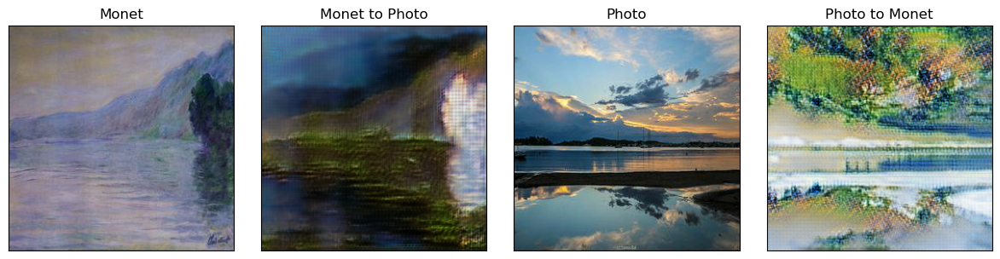

2023-10-11 22:28:38.270307 Epoch 2: Generator loss: 2.616493648947149, Discriminator loss: 0.4266785958279734


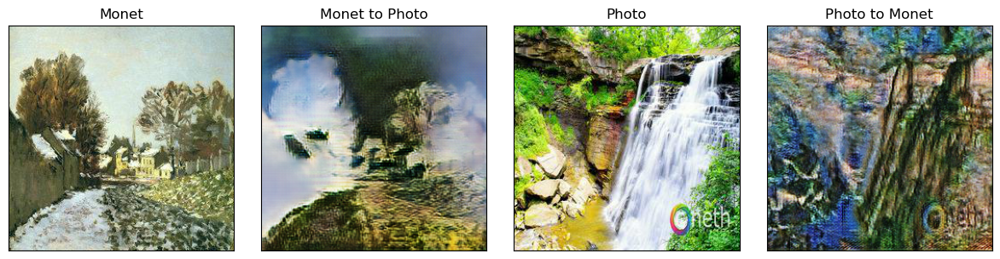

2023-10-11 22:49:16.908806 Epoch 3: Generator loss: 2.500091660834741, Discriminator loss: 0.4108706147790603


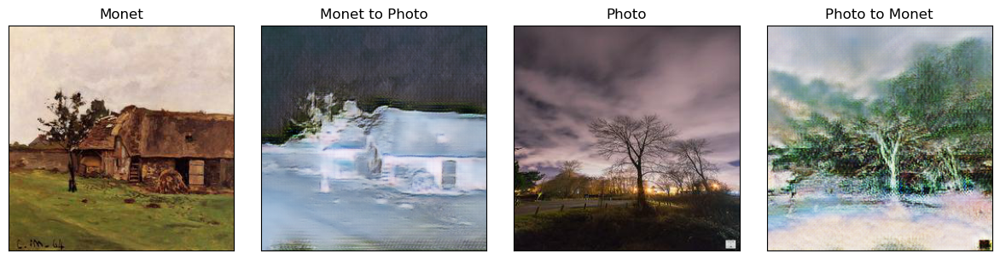

2023-10-11 23:09:51.955071 Epoch 4: Generator loss: 2.4320560229515684, Discriminator loss: 0.4015220346979365


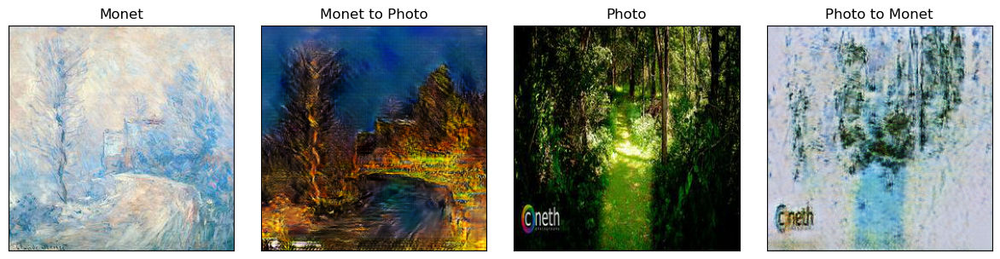

2023-10-11 23:30:26.502416 Epoch 5: Generator loss: 2.4709020827473074, Discriminator loss: 0.3699469755595361


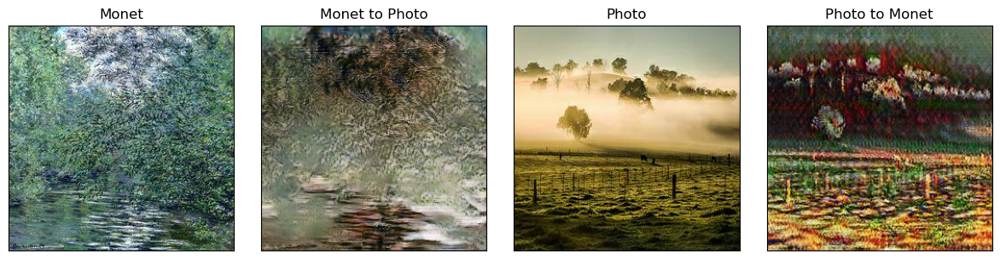

In [16]:
dim_A = 3
dim_B = 3
n_epochs = 5
batch_size = 1
lr = 2e-4
beta_1 = 0.5

adv_criterion = nn.MSELoss() 
recon_criterion = nn.L1Loss() 

gen_AB = CycleGanGenerator(dim_A, dim_B).to(device)
gen_BA = CycleGanGenerator(dim_B, dim_A).to(device)
gen_opt = torch.optim.Adam(list(gen_AB.parameters()) + list(gen_BA.parameters()), lr=lr, betas=(beta_1, 0.999))
disc_A = CycleGanDiscriminator(dim_A).to(device)
disc_A_opt = torch.optim.Adam(disc_A.parameters(), lr=lr, betas=(beta_1, 0.999))
disc_B = CycleGanDiscriminator(dim_B).to(device)
disc_B_opt = torch.optim.Adam(disc_B.parameters(), lr=lr, betas=(beta_1, 0.999))

gen_AB = gen_AB.apply(weights_init)
gen_BA = gen_BA.apply(weights_init)
disc_A = disc_A.apply(weights_init)
disc_B = disc_B.apply(weights_init)

repeat = len(photo_images)//len(monet_images)
dataset = TensorDataset(monet_images.repeat(repeat, 1, 1, 1), photo_images[random.sample(range(len(photo_images)), len(monet_images)*repeat)])
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

train_cgan_model(gen_AB, gen_BA, disc_A, disc_B, dataloader, gen_opt, disc_A_opt, disc_B_opt, n_epochs = n_epochs, verbose = True);

### 3.5 Hyperparameter Tuning

Directions:
- Effect of different learning rates
- Effect of different momentum parameters $\beta_1$

In [17]:
result_set = []
parameter_set = [
        {"lr": 1e-4, "beta_1": 0.5},
        {"lr": 2e-4, "beta_1": 0.5},
        {"lr": 1e-4, "beta_1": 0.9},
        {"lr": 2e-4, "beta_1": 0.9}
]

In [18]:
dim_A = 3
dim_B = 3
n_epochs = 5
batch_size = 1


for param in parameter_set:
    lr, beta_1 = param["lr"], param["beta_1"]

    adv_criterion = nn.MSELoss() 
    recon_criterion = nn.L1Loss() 

    gen_AB = CycleGanGenerator(dim_A, dim_B).to(device)
    gen_BA = CycleGanGenerator(dim_B, dim_A).to(device)
    gen_opt = torch.optim.Adam(list(gen_AB.parameters()) + list(gen_BA.parameters()), lr=lr, betas=(beta_1, 0.999))
    disc_A = CycleGanDiscriminator(dim_A).to(device)
    disc_A_opt = torch.optim.Adam(disc_A.parameters(), lr=lr, betas=(beta_1, 0.999))
    disc_B = CycleGanDiscriminator(dim_B).to(device)
    disc_B_opt = torch.optim.Adam(disc_B.parameters(), lr=lr, betas=(beta_1, 0.999))

    gen_AB = gen_AB.apply(weights_init)
    gen_BA = gen_BA.apply(weights_init)
    disc_A = disc_A.apply(weights_init)
    disc_B = disc_B.apply(weights_init)

    repeat = len(photo_images)//len(monet_images)
    dataset = TensorDataset(monet_images.repeat(repeat, 1, 1, 1), photo_images[random.sample(range(len(photo_images)), len(monet_images)*repeat)])
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    _, _, _, _, training_time = train_cgan_model(gen_AB, gen_BA, disc_A, disc_B, dataloader, gen_opt, disc_A_opt, disc_B_opt, n_epochs = n_epochs, verbose = False)
    result_set.append({"gen_AB": gen_AB, "gen_BA": gen_BA, "disc_A": disc_A, "disc_B": disc_B, "training_time": training_time})

### 3.6 Preparing for Kaggle Submission

<font color="red">Since we don't have proper metric for evaluating CycleGAN results, we use score from Kaggle as a criterion of choosing optimal model.</font>

In [19]:
TEMP_PATH = "temp"
if not os.path.isdir(TEMP_PATH):
    os.mkdir(TEMP_PATH)

for i in range(len(result_set)):
    for f in os.listdir(TEMP_PATH):
        os.remove(os.path.join(TEMP_PATH, f))
    gen_BA = result_set[i]["gen_BA"]
    gen_BA.eval()
    with torch.no_grad():
        for idx, image_B in enumerate(photo_images):
            image_B = image_B.to(device)
            fake_A = gen_BA(image_B)
            save_image(fake_A.to("cpu"), os.path.join(TEMP_PATH, str(idx)+".jpg"))

    if os.path.isfile(str(i)+".zip"):
        os.remove(str(i)+".zip")
    with zipfile.ZipFile(str(i)+".zip", mode="w") as zf:
        for f in os.listdir(TEMP_PATH):
            zf.write(os.path.join(TEMP_PATH, f), f)
                
    gen_BA.train()

## 4. Results and Analysis

### 4.1 Results Summary

The following table summarizes and compares the training results of the parameter set:
- We've tried to include batch_size as one of the hyperparameters. However, <font color="red">any batch size greater than 2 will cause GPU memory overflow so we don't do test on this</font>.
- Since we don't have proper metric for performance measurement (a common problem for generative models), we rely on the Kaggle's score and test case 3 (lr = 2e-4 and beta_1 = 0.9) achieve the best result
- Learning rate has a greater effect on training performance, it seems that we can test higher values but due to time constraint we don't elaborate this direction further.
- Training performance appears not sensitive to parameter $\beta_1$ in our test. This is quite expectable due to robusticity of Adam optimizer.
- CycleGAN is computationally expensive and it takes more than 1.5 hours for a 5 epochs training in the environment of this study.

In [20]:
test_cases = pd.DataFrame(parameter_set)
training_time = []
for result in result_set:
    training_time.append(result["training_time"].seconds)

test_cases["training_time (s)"] = training_time
test_cases["test score"] = [80.32203, 70.7682, 86.31948, 65.7624]

test_cases

,lr,beta_1,training_time (s),test score
0,0.0001,0.5,6174,80.32203
1,0.0002,0.5,6172,70.76820
2,0.0001,0.9,6169,86.31948
3,0.0002,0.9,6187,65.76240


### 4.2 Showcase some results of the optimal model

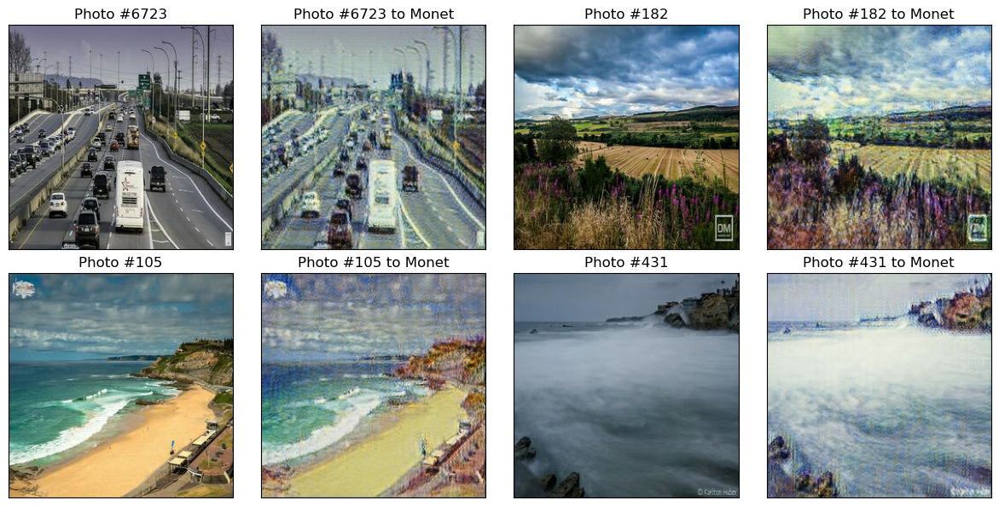

In [21]:
idx = random.sample(range(len(photo_images)), 4)
best_gen_BA = result_set[3]["gen_BA"]
best_gen_BA.eval()
photos, monets = [], []
with torch.no_grad():
    for i in idx:
        
        photos += [photo_images[i].to(device)]
        monets += [gen_BA(photo_images[i].to(device))]

fig, ax = plt.subplots(2, 4, figsize = (12, 6))
for i in range(4):
    ax[i//2, 2*(i%2)].imshow(photos[i].detach().squeeze().permute((1, 2, 0)).to("cpu"))
    ax[i//2, 2*(i%2)].set_xticks([])
    ax[i//2, 2*(i%2)].set_yticks([])
    ax[i//2, 2*(i%2)].set_title("Photo #" + str(idx[i]))
    
    ax[i//2, 2*(i%2)+1].imshow(monets[i].detach().squeeze().permute((1, 2, 0)).to("cpu"))
    ax[i//2, 2*(i%2)+1].set_xticks([])
    ax[i//2, 2*(i%2)+1].set_yticks([])    
    ax[i//2, 2*(i%2)+1].set_title("Photo #" + str(idx[i]) + " to Monet")
plt.tight_layout()
plt.show()

### 4.3 Kaggle Results

- <font color="red">Best Public Score = 65.7624</font>

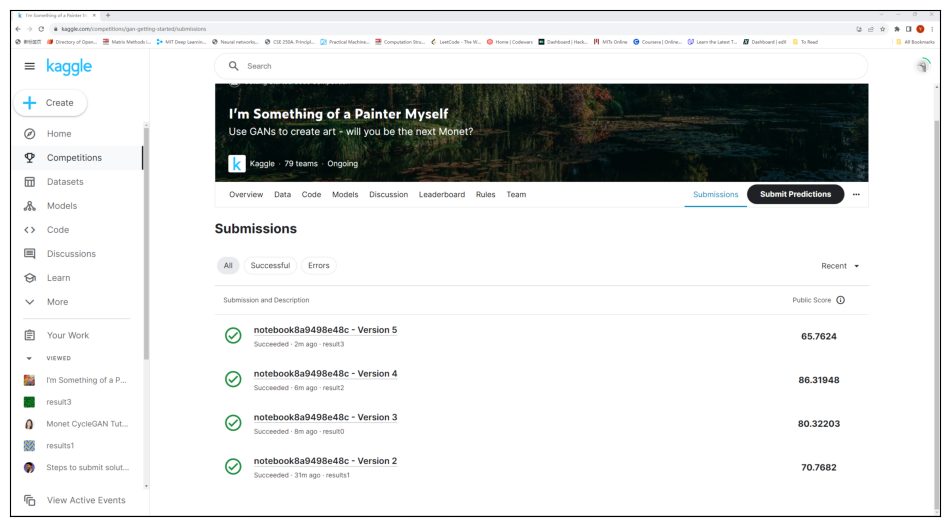

In [22]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
ax.imshow(cv2.cvtColor(cv2.imread("images/kaggle_results.png"), cv2.COLOR_BGR2RGB))
ax.set_xticks([])
ax.set_yticks([])
plt.show()

## 5. Discussion and Conclusion

### 5.1 Learning and Takeaways
- Simple generative model likes DCGAN doesn't work in this study. This might be due to insufficient amount of training data (Monet images) or additional techniques (e.g. WGAN) and more advanced architectures are needed.
- CycleGAN is very effective at solving image style transfer problems, especially when dealing with unpaired data.
- The style transfer task from photo to Monet is easier than the one from Monet to photo. Since the former is more or less like a blurring effect and the latter required far more details to complete.
- Unlike some other machine learning tasks where there may be a clear and widely-accepted metric (e.g., accuracy for classification), there is no single metric that universally captures the quality of GAN-generated data. This makes it difficult to compare different GAN models and assess their performance. In this study, we use the Kaggle's score as our proxy.
- GANs are known to be resource-intensive in terms of both computational resources and data. In this study with moderate complexity of model and size of data, it is already hitting performance bottleneck of current computation environment.
- Designing the appropriate loss functions for the CycleGAN framework can be tricky. In this study, CycleGAN employs adversarial loss, cycle consistency loss, and identity loss. Balancing these loss terms to achieve desired results can be challenging.
- Training a GAN can be unstable. The optimization process might not always converge, and there can be issues like vanishing gradients or mode collapses, where the generator produces a limited set of output images, resulting in a lack of diversity in the generated samples.

### 5.2 Possible Future Works
- In addition to CycleGAN, UNIT (Unsupervised Image-to-Image Translation Networks) is also good at style transfer task. It aims to learn a shared latent space between two domains, allowing for translation without the need for paired data.
- DCGAN doesn't work well in this study, since it only learns indirect from the feedback of discriminator. Variational Autoencoder (VAE) might be a better choice in this case.
- Try possible data augmentation techniques to alleviate the problem of insufficient data